In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [17]:
# Load the dataset
file_path = r"C:\Users\gopik\OneDrive\Desktop\upgrad\projects\boxify\Boxify Dataset - Data Analyst Bootcamp.csv"
sales_data = pd.read_csv(r"C:\Users\gopik\OneDrive\Desktop\upgrad\projects\boxify\Boxify Dataset - Data Analyst Bootcamp.csv")

# Display the first few rows
print(sales_data.head())


   Order   File_Type  SKU_number  SoldFlag  SoldCount MarketingType  \
0      2  Historical     1737127         0          0             D   
1      3  Historical     3255963         0          0             D   
2      4  Historical      612701         0          0             D   
3      6  Historical      115883         1          1             D   
4      7  Historical      863939         1          1             D   

   ReleaseNumber  New_Release_Flag  StrengthFactor  PriceReg  ReleaseYear  \
0             15                 1        682743.0     44.99         2015   
1              7                 1       1016014.0     24.81         2005   
2              0                 0        340464.0     46.00         2013   
3              4                 1        334011.0    100.00         2006   
4              2                 1       1287938.0    121.95         2010   

   ItemCount  LowUserPrice  LowNetPrice  
0          8         28.97        31.84  
1         39          0.00

In [19]:
# Check the structure and data types
print(sales_data.info())

# Summary statistics
print(sales_data.describe())

# Check for missing values
print(sales_data.isnull().sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198917 entries, 0 to 198916
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Order             198917 non-null  int64  
 1   File_Type         198917 non-null  object 
 2   SKU_number        198917 non-null  int64  
 3   SoldFlag          198917 non-null  int64  
 4   SoldCount         198917 non-null  int64  
 5   MarketingType     198917 non-null  object 
 6   ReleaseNumber     198917 non-null  int64  
 7   New_Release_Flag  198917 non-null  int64  
 8   StrengthFactor    198917 non-null  float64
 9   PriceReg          198917 non-null  float64
 10  ReleaseYear       198917 non-null  int64  
 11  ItemCount         198917 non-null  int64  
 12  LowUserPrice      198917 non-null  float64
 13  LowNetPrice       198917 non-null  float64
dtypes: float64(4), int64(8), object(2)
memory usage: 21.2+ MB
None
               Order    SKU_number       SoldFlag    

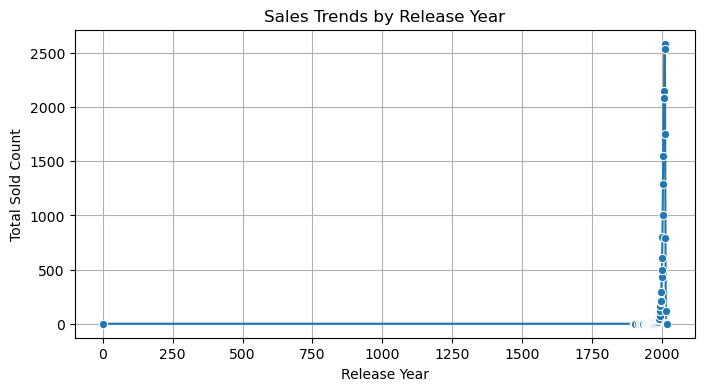

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by ReleaseYear and sum SoldCount
yearly_sales = sales_data.groupby('ReleaseYear')['SoldCount'].sum().reset_index()

# Plot the sales trends
plt.figure(figsize=(8, 4))
sns.lineplot(data=yearly_sales, x='ReleaseYear', y='SoldCount', marker='o')
plt.title('Sales Trends by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Total Sold Count')
plt.grid(True)
plt.show()


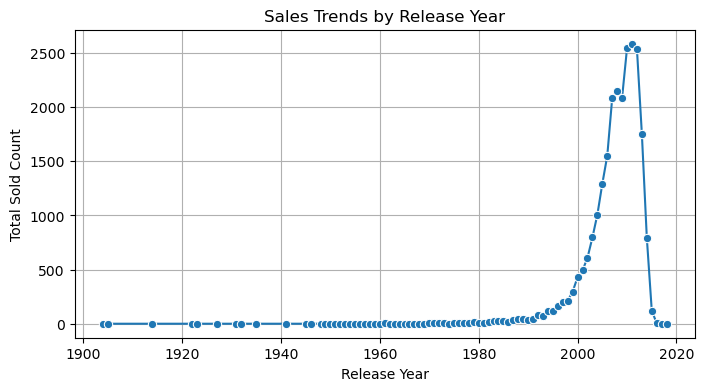

In [71]:
# Filtering the data to only include reasonable ReleaseYear values (e.g., > 1900)
valid_sales_data = sales_data[sales_data['ReleaseYear'] > 1900]

# Re-plot the sales trends
import matplotlib.pyplot as plt
import seaborn as sns

# Grouping by ReleaseYear to sum SoldCount
sales_trends = valid_sales_data.groupby('ReleaseYear')['SoldCount'].sum().reset_index()

# Plotting the corrected sales trends
plt.figure(figsize=(8, 4))
sns.lineplot(data=sales_trends, x='ReleaseYear', y='SoldCount', marker='o')
plt.title('Sales Trends by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Total Sold Count')
plt.grid(True)
plt.show()


C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\137302005.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




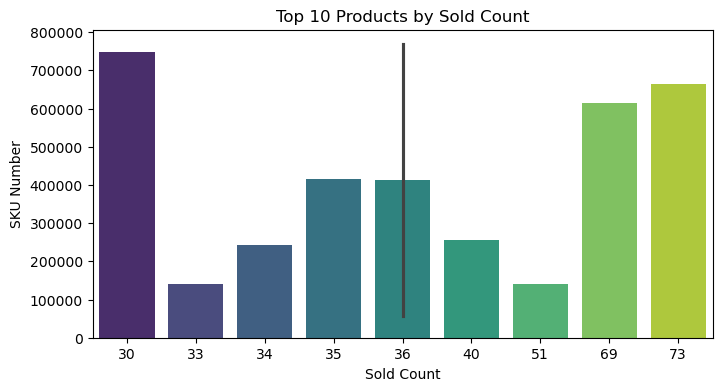

In [51]:
# Top 10 products based on SoldCount
top_products = sales_data.groupby('SKU_number')['SoldCount'].sum().sort_values(ascending=False).head(10).reset_index()

# Plot top 10 products
plt.figure(figsize=(8, 4))
sns.barplot(data=top_products, x='SoldCount', y='SKU_number', palette='viridis')
plt.title('Top 10 Products by Sold Count')
plt.xlabel('Sold Count')
plt.ylabel('SKU Number')
plt.show()


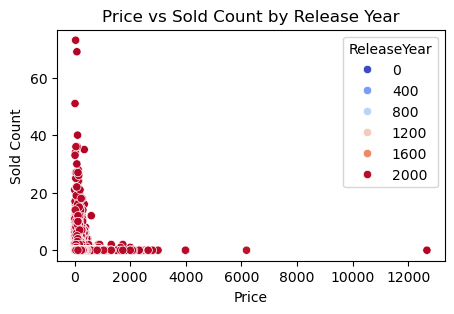

In [55]:
# Relationship between PriceReg and SoldCount
plt.figure(figsize=(5, 3))
sns.scatterplot(data=sales_data, x='PriceReg', y='SoldCount', hue='ReleaseYear', palette='coolwarm')
plt.title('Price vs Sold Count by Release Year')
plt.xlabel('Price')
plt.ylabel('Sold Count')
plt.show()


In [27]:
# Define low stock threshold (you can adjust this threshold as needed)
low_stock_threshold = 10

# Filter products that are below the threshold
low_stock_items = sales_data[sales_data['ItemCount'] < low_stock_threshold]

# Display low-stock items
print("Low-stock items (ItemCount < 10):")
print(low_stock_items[['SKU_number', 'ItemCount']].head())

# Count the total number of low-stock items
low_stock_count = low_stock_items['SKU_number'].nunique()
print(f"Total number of low-stock products: {low_stock_count}")


Low-stock items (ItemCount < 10):
      SKU_number  ItemCount
0        1737127          8
118       873654          5
350       613288          9
797       521116          2
1073      659971          8
Total number of low-stock products: 3095


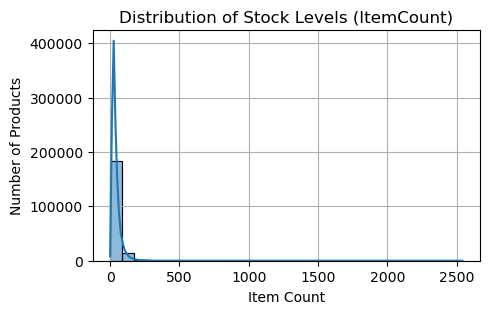

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of stock levels (ItemCount)
plt.figure(figsize=(5, 3))
sns.histplot(sales_data['ItemCount'], bins=30, kde=True)
plt.title('Distribution of Stock Levels (ItemCount)')
plt.xlabel('Item Count')
plt.ylabel('Number of Products')
plt.grid(True)
plt.show()


Top low-stock items with high sales:
       SKU_number  ItemCount  SoldCount
26488     1475488          8         12
72303      664616          9          8
53028     1946541          8          3
19424     1453226          9          3
27786     1656831          9          3


C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\1249645214.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




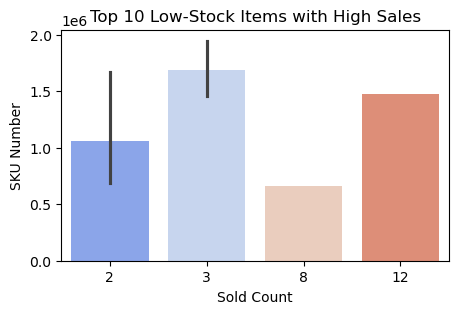

In [59]:
# Filter products with low stock and high sales
low_stock_high_sales = low_stock_items[low_stock_items['SoldCount'] > 0].sort_values(by='SoldCount', ascending=False)

# Display top low-stock items with high sales
print("Top low-stock items with high sales:")
print(low_stock_high_sales[['SKU_number', 'ItemCount', 'SoldCount']].head())

# Plot the top low-stock items with high sales
plt.figure(figsize=(5, 3))
sns.barplot(data=low_stock_high_sales.head(10), x='SoldCount', y='SKU_number', palette='coolwarm')
plt.title('Top 10 Low-Stock Items with High Sales')
plt.xlabel('Sold Count')
plt.ylabel('SKU Number')
plt.show()


Top 10 products by Inventory Turnover:
        SKU_number  Inventory_Turnover
41144      2751184                 inf
75467      3474212                 inf
89541      1855137                 inf
89657      1857970                 inf
102146     3136590                 inf
172734     3218991                 inf
145902     2485383                 inf
129808     3212060                 inf
52779      3635010                 inf
41858      3282329                 inf


C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\4147060164.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




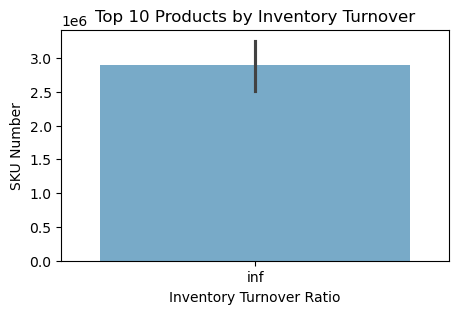

In [61]:
# Step 1: Calculate Inventory Turnover
# Assuming PriceReg is a proxy for COGS and ItemCount represents the stock level

# Calculate the average inventory (assuming beginning and ending inventory are the same as ItemCount)
sales_data['Average_Inventory'] = sales_data['ItemCount']

# Calculate Inventory Turnover: COGS / Average Inventory
sales_data['Inventory_Turnover'] = sales_data['PriceReg'] / sales_data['Average_Inventory']

# Display Inventory Turnover for the top products
inventory_turnover = sales_data[['SKU_number', 'Inventory_Turnover']].sort_values(by='Inventory_Turnover', ascending=False).head(10)
print("Top 10 products by Inventory Turnover:")
print(inventory_turnover)

# Visualizing Inventory Turnover
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5, 3))
sns.barplot(data=inventory_turnover, x='Inventory_Turnover', y='SKU_number', palette='Blues')
plt.title('Top 10 Products by Inventory Turnover')
plt.xlabel('Inventory Turnover Ratio')
plt.ylabel('SKU Number')
plt.show()


C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\2790656790.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\2790656790.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Top 10 products by Stock-to-Sales Ratio:
       SKU_number  Stock_to_Sales_Ratio
74275      536345                1523.0
685        145889                 851.0
52848      195490                 629.0
17986      147632                 611.0
3758       212480                 579.0
3823       233738                 565.0
42001       53019                 541.0
72904      599612                 515.0
6333        52533                 492.0
31834      672655                 468.0


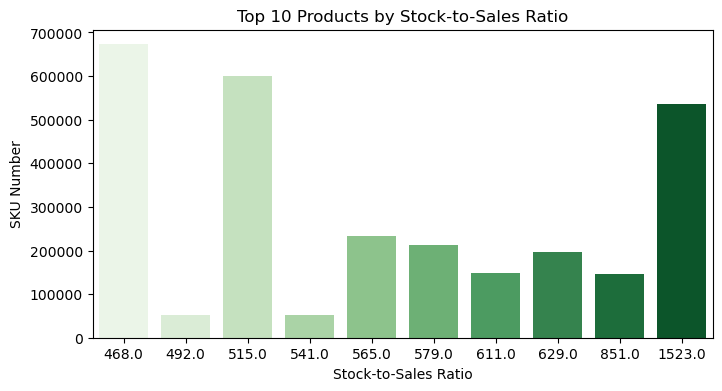

In [63]:
# Step 2: Calculate Stock-to-Sales Ratio
# Stock-to-Sales Ratio = Stock Level (ItemCount) / Sales (SoldCount)

# Avoid division by zero by filtering out rows where SoldCount is zero
sales_data_filtered = sales_data[sales_data['SoldCount'] > 0]

# Calculate the Stock-to-Sales Ratio
sales_data_filtered['Stock_to_Sales_Ratio'] = sales_data_filtered['ItemCount'] / sales_data_filtered['SoldCount']

# Display top 10 products by Stock-to-Sales Ratio
stock_sales_ratio = sales_data_filtered[['SKU_number', 'Stock_to_Sales_Ratio']].sort_values(by='Stock_to_Sales_Ratio', ascending=False).head(10)
print("Top 10 products by Stock-to-Sales Ratio:")
print(stock_sales_ratio)

# Visualizing Stock-to-Sales Ratio
plt.figure(figsize=(8, 4))
sns.barplot(data=stock_sales_ratio, x='Stock_to_Sales_Ratio', y='SKU_number', palette='Greens')
plt.title('Top 10 Products by Stock-to-Sales Ratio')
plt.xlabel('Stock-to-Sales Ratio')
plt.ylabel('SKU Number')
plt.show()


Top 10 products by Reorder Point:
        SKU_number  Reorder_Point
125452      672549     254.200000
98496       924198     163.400000
117615       53985     163.100000
74275       536345     152.533333
195045      536345     152.300000
75332       198645     142.600000
197557      198645     142.600000
114413       54246     124.400000
118411      160073     122.700000
123862      672653     109.200000


C:\Users\gopik\AppData\Local\Temp\ipykernel_21780\1345875093.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




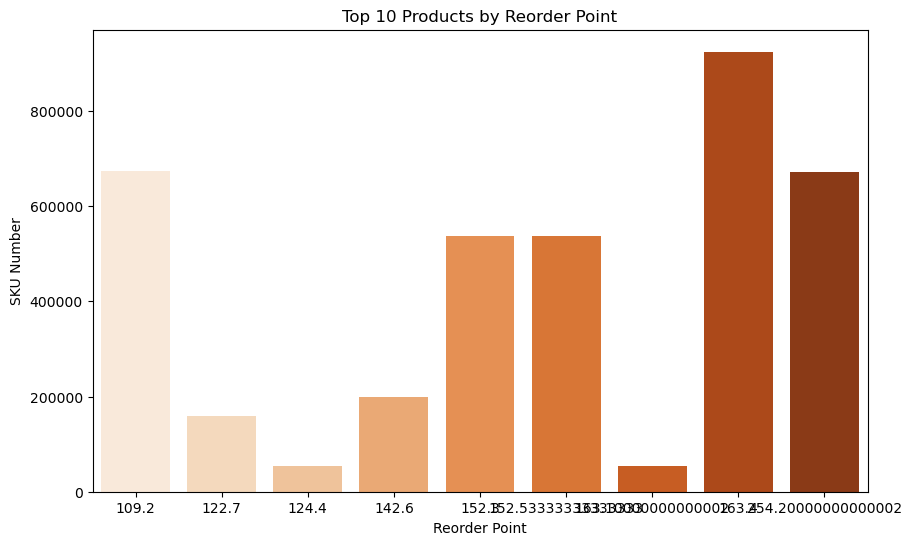

In [67]:
# Step 3: Calculate Reorder Point
# Assuming Average_Daily_Usage and Lead_Time are given or estimated

# Example values for average daily usage and lead time
sales_data['Average_Daily_Usage'] = sales_data['SoldCount'] / 30  # Assuming 30 days in a month
sales_data['Lead_Time'] = 7  # Assuming a lead time of 7 days (this can be adjusted)

# Assuming Safety Stock is 10% of the stock level (this can be adjusted)
sales_data['Safety_Stock'] = 0.10 * sales_data['ItemCount']

# Reorder Point = (Average Daily Usage * Lead Time) + Safety Stock
sales_data['Reorder_Point'] = (sales_data['Average_Daily_Usage'] * sales_data['Lead_Time']) + sales_data['Safety_Stock']

# Display top 10 products by Reorder Point
reorder_point = sales_data[['SKU_number', 'Reorder_Point']].sort_values(by='Reorder_Point', ascending=False).head(10)
print("Top 10 products by Reorder Point:")
print(reorder_point)

# Visualizing Reorder Points
plt.figure(figsize=(10, 6))
sns.barplot(data=reorder_point, x='Reorder_Point', y='SKU_number', palette='Oranges')
plt.title('Top 10 Products by Reorder Point')
plt.xlabel('Reorder Point')
plt.ylabel('SKU Number')
plt.show()


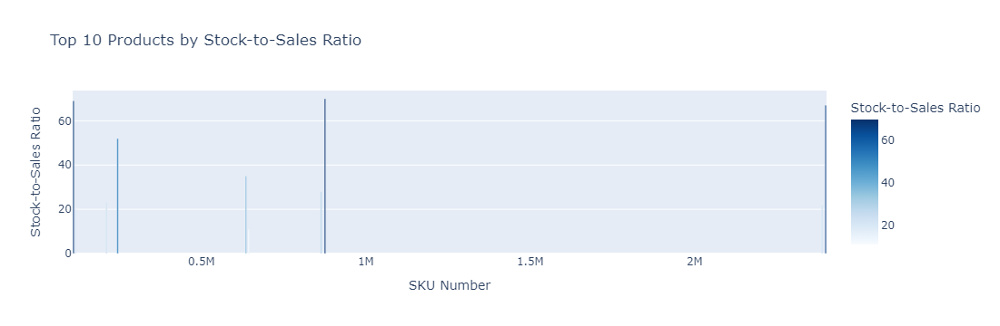

In [45]:
# Create interactive bar plot for Stock-to-Sales Ratio
fig = px.bar(sales_data_filtered.head(10), x='SKU_number', y='Stock_to_Sales_Ratio',
             title='Top 10 Products by Stock-to-Sales Ratio',
             labels={'Stock_to_Sales_Ratio': 'Stock-to-Sales Ratio', 'SKU_number': 'SKU Number'},
             color='Stock_to_Sales_Ratio', color_continuous_scale='Blues')

fig.update_layout(xaxis_title='SKU Number', yaxis_title='Stock-to-Sales Ratio', coloraxis_showscale=True)
fig.show()


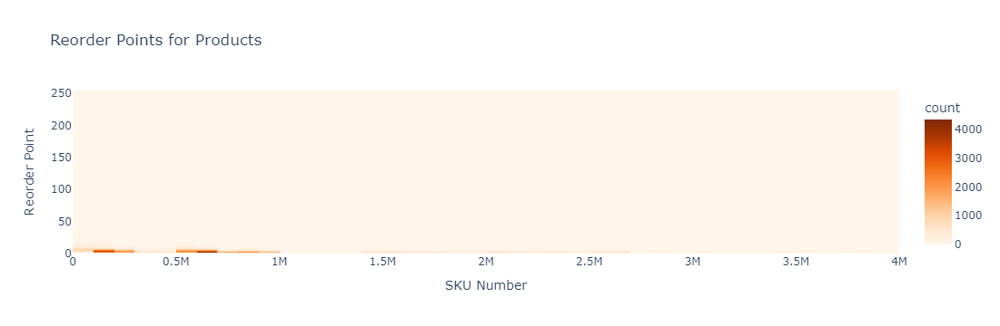

In [47]:
# Create an interactive heatmap for Reorder Points
fig = px.density_heatmap(sales_data, x='SKU_number', y='Reorder_Point', title='Reorder Points for Products',
                         labels={'Reorder_Point': 'Reorder Point', 'SKU_number': 'SKU Number'},
                         color_continuous_scale='Oranges')

# Customize the chart layout
fig.update_layout(xaxis_title='SKU Number', yaxis_title='Reorder Point')
fig.show()
